# Import the necessary libraries

In [110]:
import sqlite3
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from fbprophet.make_holidays import make_holidays_df
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from prophet import Prophet
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import copy
import matplotlib.pyplot as plt
import plotly.offline as pyoff
import plotly.graph_objs as go

# Connect to the database

In [20]:
conn = sqlite3.connect('clean_database.db')
cursor = conn.cursor()

# Check all the tables available within the database

In [27]:
cursor.execute("SELECT name FROM sqlite_master WHERE type ='table';")
print(cursor.fetchall())

[('Meteostat_Data',), ('Entsoe_Data',), ('Entsoe_Meteostat_Data',), ('Entsoe_real_data',), ('Entsoe_real_values_and_Meteostat_data',), ('Entsoe_forecasted_data',), ('Entsoe_forecasted_data_and_Meteostat_data',), ('Feature_selected_real_data',), ('Feature_selected_forecasted_data',), ('y_train',), ('y_test',), ('X_train_real',), ('X_test_real',), ('X_train_forecasted',), ('X_test_forecasted',)]


# Retrieving the necesary tables from database

In [61]:
X_train = pd.read_sql("SELECT * FROM X_train_real;", conn)
X_train["timestamp"] = pd.to_datetime(X_train["timestamp"])
X_train = X_train.set_index("timestamp")

In [62]:
X_test = pd.read_sql("SELECT * FROM X_test_forecasted;", conn)
X_test["timestamp"] = pd.to_datetime(X_test["timestamp"])
X_test = X_test.set_index("timestamp")

In [30]:
y_train = pd.read_sql("SELECT * FROM y_train;", conn)
y_train["timestamp"] = pd.to_datetime(y_train["timestamp"])
y_train = y_train.set_index("timestamp")

In [31]:
y_test = pd.read_sql("SELECT * FROM y_test;", conn)
y_test["timestamp"] = pd.to_datetime(y_test["timestamp"])
y_test = y_test.set_index("timestamp")

# LinearRegression

### Train

In [65]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [66]:
reg1 = LinearRegression()
reg1 = reg1.fit(X_train, y_train_r)
yp1 = reg1.predict(X_train)

In [174]:
rmse1 = mean_squared_error(y_true = y_train_r, y_pred = yp1, squared=False)
mae1 = mean_absolute_error(y_true = y_train_r, y_pred = yp1)
mape1 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp1)
print(f"RMSE value: {rmse1}. MAE value: {mae1}. MAPE value: {mape1}")

RMSE value: 218.2880520432498. MAE value: 166.79000062948745. MAPE value: 0.024944090977389366


In [69]:
results1 = pd.DataFrame(yp1, columns = ['yp_train'])
results1.index = y_train.index
results1["real_energy_load"] = y_train

<AxesSubplot:xlabel='timestamp'>

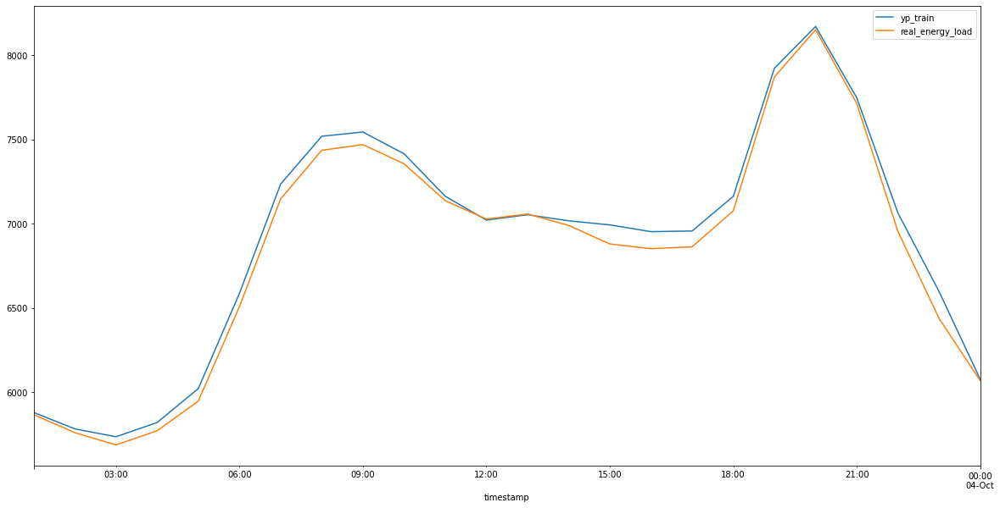

In [70]:
results1.iloc[:24,:].plot(figsize = (20,10))

In [150]:
fig_1 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_1.add_trace(go.Scatter(x = X_train.index, y = y_train["real_energy_load"], name ='Actual'))
fig_1.add_trace(go.Scatter(x = X_train.index, y = yp1, name='Predicted'))

### Test

In [71]:
yp2 = reg1.predict(X_test)

In [173]:
rmse2 = mean_squared_error(y_true = y_test_r, y_pred = yp2, squared=False)
mae2 = mean_absolute_error(y_true = y_test_r, y_pred = yp2)
mape2 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp2)
print(f"RMSE value: {rmse2}. MAE value: {mae2}. MAPE value: {mape2}")

RMSE value: 652.244663231006. MAE value: 499.85527253759267. MAPE value: 0.07080504407863403


In [186]:
results2 = pd.DataFrame(yp2, columns = ['yp_test_LinearRegresion'])
results2.index = y_test.index
results2["real_energy_load"] = y_test
results2

,yp_test_LinearRegresion,real_energy_load
timestamp,,
2021-08-03 01:00:00,5659.146531,6115.00
2021-08-03 02:00:00,5548.943804,5937.50
2021-08-03 03:00:00,5576.302969,5820.50
2021-08-03 04:00:00,5689.095872,5827.00
2021-08-03 05:00:00,5875.667347,5913.50
...,...,...
2021-12-31 19:00:00,7595.537225,7577.25
2021-12-31 20:00:00,7407.097551,7227.25
2021-12-31 21:00:00,7225.320468,6839.25


In [187]:
results2.to_sql("LinearRegresion_Train_Real_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)

<AxesSubplot:xlabel='timestamp'>

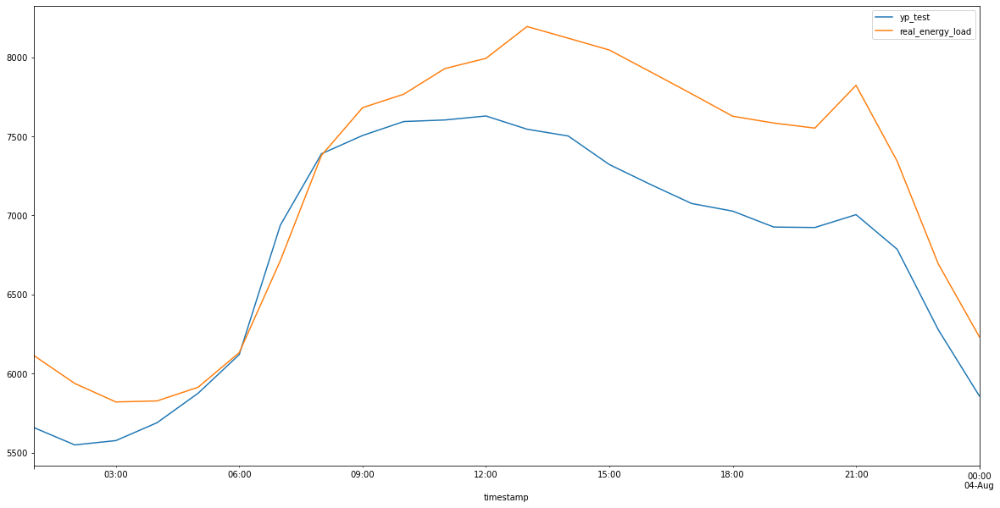

In [75]:
results2.iloc[:24,:].plot(figsize = (20,10))

In [151]:
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x = X_test.index, y = y_test["real_energy_load"], name ='Actual'))
fig_2.add_trace(go.Scatter(x = X_test.index, y = yp2, name='Predicted'))

# RandomForestRegressor

### Train

In [76]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [77]:
reg2 = RandomForestRegressor()
reg2 = reg2.fit(X_train, y_train_r)
yp3 = reg2.predict(X_train)

In [172]:
rmse3 = mean_squared_error(y_true = y_train_r, y_pred = yp3, squared=False)
mae3 = mean_absolute_error(y_true = y_train_r, y_pred = yp3)
mape3 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp3)
print(f"RMSE value: {rmse3}. MAE value: {mae3}. MAPE value: {mape3}")

RMSE value: 46.74963199337861. MAE value: 32.66992356358786. MAPE value: 0.004794270835707819


In [81]:
results3 = pd.DataFrame(yp3, columns = ['yp_train'])
results3.index = y_train.index
results3["real_energy_load"] = y_train

<AxesSubplot:xlabel='timestamp'>

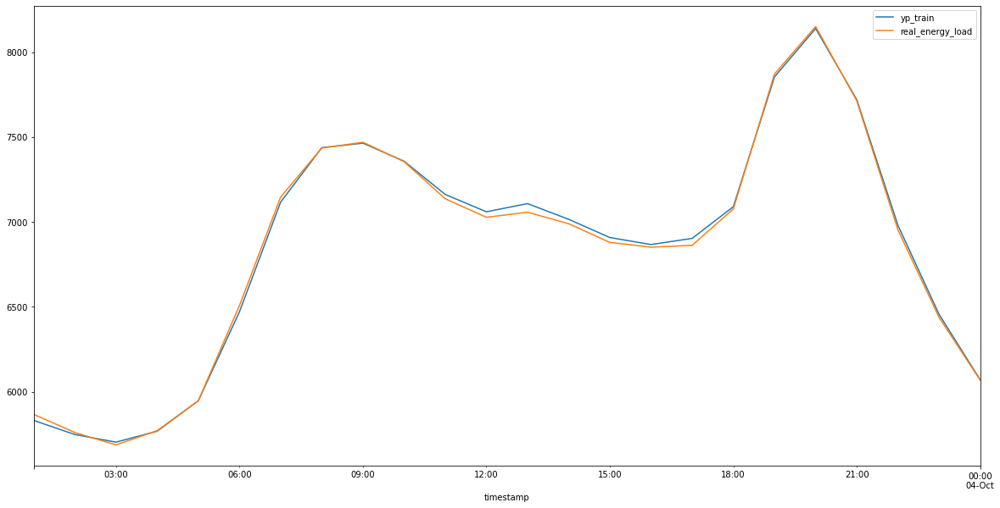

In [82]:
results3.iloc[:24,:].plot(figsize = (20,10))

In [152]:
fig_1 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_1.add_trace(go.Scatter(x = X_train.index, y = y_train["real_energy_load"], name ='Actual'))
fig_1.add_trace(go.Scatter(x = X_train.index, y = yp3, name='Predicted'))

### Test

In [83]:
yp4 = reg2.predict(X_test)

In [171]:
rmse4 = mean_squared_error(y_true = y_test_r, y_pred = yp4, squared=False)
mae4 = mean_absolute_error(y_true = y_test_r, y_pred = yp4)
mape4 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp4)
print(f"RMSE value: {rmse4}. MAE value: {mae4}. MAPE value: {mape4}")

RMSE value: 326.5632714119016. MAE value: 187.8541004837875. MAPE value: 0.026456714607443987


In [184]:
results4 = pd.DataFrame(yp4, columns = ['yp_test_RandomForest'])
results4.index = y_test.index
results4["real_energy_load"] = y_test
results4

,yp_test_RandomForest,real_energy_load
timestamp,,
2021-08-03 01:00:00,6108.245000,6115.00
2021-08-03 02:00:00,5996.335000,5937.50
2021-08-03 03:00:00,5965.142500,5820.50
2021-08-03 04:00:00,5946.982500,5827.00
2021-08-03 05:00:00,6020.712500,5913.50
...,...,...
2021-12-31 19:00:00,7752.827500,7577.25
2021-12-31 20:00:00,7714.445000,7227.25
2021-12-31 21:00:00,7265.450833,6839.25


In [185]:
results4.to_sql("RandomForest_Train_Real_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)

<AxesSubplot:xlabel='timestamp'>

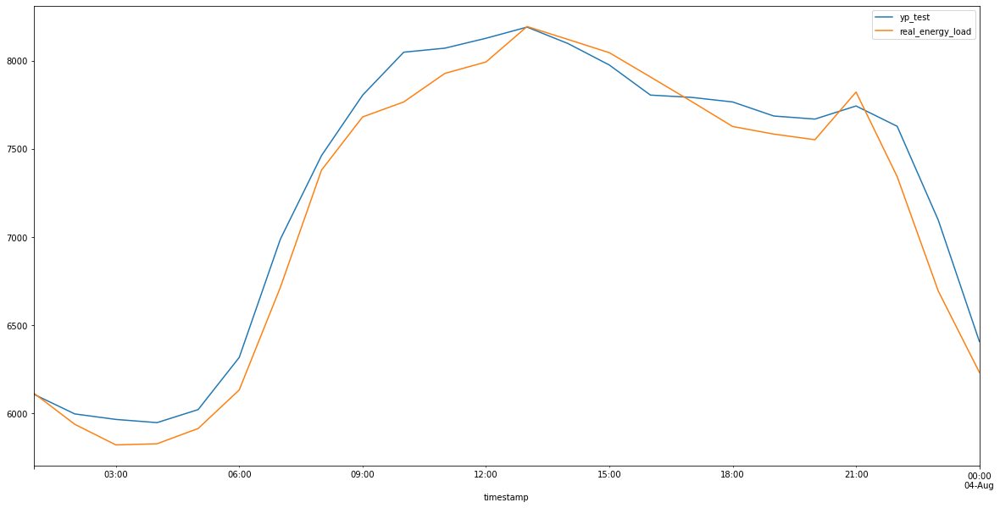

In [87]:
results4.iloc[:24,:].plot(figsize = (20,10))

In [153]:
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x = X_test.index, y = y_test["real_energy_load"], name ='Actual'))
fig_2.add_trace(go.Scatter(x = X_test.index, y = yp4, name='Predicted'))

# Prophet

### Train

In [122]:
y_train_r = np.ravel(y_train, order='C')
y_test_r = np.ravel(y_test, order='C')

In [123]:
# Create features list
features = list(X_train.columns.to_list())

In [124]:
def holidays_features(df: pd.DataFrame, country='RO'):
    """Holidays features selecton"""
    # Prophet mode
    from fbprophet.make_holidays import make_holidays_df
    year_list = df.index.year.unique().tolist()

    # Identify the final year, as an integer, and increase it by 1
    year_list.append(year_list[-1] + 1)
    holidays_df = make_holidays_df(year_list=year_list, country=country)

    return holidays_df

In [125]:
holidays_df = holidays_features(y_train)
holidays_df

,ds,holiday
0,2017-01-01,Anul Nou
1,2017-01-02,Anul Nou
2,2017-01-24,Unirea Principatelor Române
3,2017-04-14,Paștele
4,2017-04-16,Paștele
...,...,...
85,2022-08-15,Adormirea Maicii Domnului
86,2022-11-30,Sfântul Andrei
87,2022-12-01,Ziua Națională a României
88,2022-12-25,Crăciunul


In [127]:
X_train_prophet = X_train.copy()
X_train_prophet['y'] = y_train["real_energy_load"]
X_train_prophet = X_train_prophet.reset_index()
X_train_prophet = X_train_prophet.rename(columns = {'timestamp': 'ds'})
X_train_prophet

,ds,real_energy_produced,imported_real_energy,exported_real_energy,avg_air_temp (°C),avg_rel_humidity (%),avg_wind_speed (km/h),avg_sea-lvl_air_pres (hPa),hour,day_of_week,day_of_year,holidays_encoded,real_energy_load_lag24,real_energy_load_roll_min168,y
0,2017-10-03 01:00:00,-1.271889,0.476815,-0.229048,-0.774438,1.016265,-0.958030,1.224477,-1.517054,-0.999896,0.894458,-0.182989,-1.491324,-0.186323,5866.00
1,2017-10-03 02:00:00,-1.321034,0.304496,-0.255141,-0.809492,1.058201,-0.958030,1.171745,-1.372586,-0.999896,0.894458,-0.182989,-1.573375,-0.186323,5759.00
2,2017-10-03 03:00:00,-1.420270,0.387783,-0.249342,-0.855331,1.149061,-0.958030,1.166642,-1.228119,-0.999896,0.894458,-0.182989,-1.586732,-0.186323,5686.00
3,2017-10-03 04:00:00,-1.385301,0.361936,-0.420395,-0.880948,1.197986,-0.958030,1.149632,-1.083652,-0.999896,0.894458,-0.182989,-1.505635,-0.186323,5770.00
4,2017-10-03 05:00:00,-1.318199,0.459583,-0.620440,-0.899823,1.149061,-1.568678,1.142828,-0.939184,-0.999896,0.894458,-0.182989,-1.242311,-0.186323,5946.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33591,2021-08-02 20:00:00,0.294622,0.888943,-1.191583,1.367883,-0.731052,0.059716,-0.736799,1.227827,-1.499933,0.314136,-0.182989,0.148011,0.000206,7991.75
33592,2021-08-02 21:00:00,0.317068,0.694127,-1.264063,1.187221,-0.248793,-0.347382,-0.665356,1.372294,-1.499933,0.314136,-0.182989,0.345504,0.000206,8087.00
33593,2021-08-02 22:00:00,-0.088382,0.507210,-1.203180,1.075319,-0.109007,-0.245608,-0.605820,1.516761,-1.499933,0.314136,-0.182989,0.049026,0.000206,7604.50
33594,2021-08-02 23:00:00,-0.578891,0.692931,-1.165490,1.009256,-0.004168,-1.082421,-0.542883,1.661229,-1.499933,0.314136,-0.182989,-0.395333,0.000206,6991.25


In [128]:
# Prophet model
model = Prophet(growth='linear',          
                changepoint_range=0.3,
                changepoint_prior_scale=0.01,
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=True,
                holidays=holidays_df,
                seasonality_mode='additive',
                seasonality_prior_scale=0.5,
                holidays_prior_scale=1.0,
                #mcmc_samples=10,
                interval_width=0.90,
                uncertainty_samples=1000,
                stan_backend=None)

# Add feature data
for feature in features:
    model.add_regressor(feature)

# Add holidays data
model.add_country_holidays(country_name='RO')

# Fit model
model = model.fit(X_train_prophet)

# Make prediction
training_demand_forecast = model.predict(X_train_prophet)

In [129]:
training_demand_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Adormirea Maicii Domnului,Adormirea Maicii Domnului_lower,Adormirea Maicii Domnului_upper,Anul Nou,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-10-03 01:00:00,6838.447006,5614.954774,6241.711874,6838.447006,6838.447006,0.0,0.0,0.0,0.0,...,98.508373,98.508373,98.508373,24.520976,24.520976,24.520976,0.0,0.0,0.0,5903.504643
1,2017-10-03 02:00:00,6838.472483,5471.642421,6092.228846,6838.472483,6838.472483,0.0,0.0,0.0,0.0,...,94.265784,94.265784,94.265784,24.761356,24.761356,24.761356,0.0,0.0,0.0,5783.270551
2,2017-10-03 03:00:00,6838.497960,5413.383052,6034.237627,6838.497960,6838.497960,0.0,0.0,0.0,0.0,...,89.434090,89.434090,89.434090,25.001811,25.001811,25.001811,0.0,0.0,0.0,5715.476971
3,2017-10-03 04:00:00,6838.523437,5481.689633,6078.252163,6838.523437,6838.523437,0.0,0.0,0.0,0.0,...,84.085934,84.085934,84.085934,25.242338,25.242338,25.242338,0.0,0.0,0.0,5781.247670
4,2017-10-03 05:00:00,6838.548914,5679.730630,6289.725644,6838.548914,6838.548914,0.0,0.0,0.0,0.0,...,78.297447,78.297447,78.297447,25.482934,25.482934,25.482934,0.0,0.0,0.0,5976.087838
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33591,2021-08-02 20:00:00,6866.488207,7558.068064,8152.520073,6866.488207,6866.488207,0.0,0.0,0.0,0.0,...,108.688969,108.688969,108.688969,-5.326439,-5.326439,-5.326439,0.0,0.0,0.0,7864.610041
33592,2021-08-02 21:00:00,6866.487836,7537.465624,8160.560536,6866.487836,6866.487836,0.0,0.0,0.0,0.0,...,108.302889,108.302889,108.302889,-4.999232,-4.999232,-4.999232,0.0,0.0,0.0,7849.662077
33593,2021-08-02 22:00:00,6866.487465,7094.205046,7687.990027,6866.487465,6866.487465,0.0,0.0,0.0,0.0,...,107.044784,107.044784,107.044784,-4.671593,-4.671593,-4.671593,0.0,0.0,0.0,7384.308081
33594,2021-08-02 23:00:00,6866.487094,6621.416980,7240.457173,6866.487094,6866.487094,0.0,0.0,0.0,0.0,...,104.958106,104.958106,104.958106,-4.343527,-4.343527,-4.343527,0.0,0.0,0.0,6923.291676


In [130]:
yp5 = training_demand_forecast["yhat"]

In [170]:
rmse5 = mean_squared_error(y_true = y_train_r, y_pred = yp5, squared=False)
mae5 = mean_absolute_error(y_true = y_train_r, y_pred = yp5)
mape5 = mean_absolute_percentage_error(y_true = y_train_r, y_pred = yp5)
print(f"RMSE value: {rmse5}. MAE value: {mae5}. MAPE value: {mape5}")

RMSE value: 182.90923227615306. MAE value: 139.07220011636247. MAPE value: 0.0208831029477788


In [133]:
# Plot demand forecasting
fig_2 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_2.add_trace(go.Scatter(x=X_train_prophet['ds'], y=X_train_prophet['y'], name='Actual'))
fig_2.add_trace(go.Scatter(x=training_demand_forecast['ds'], y=training_demand_forecast['yhat'], name='Predicted'))

### Test

In [134]:
X_test_prophet = X_test.copy()
X_test_prophet['y'] = y_test["real_energy_load"]
X_test_prophet = X_test_prophet.reset_index()
X_test_prophet = X_test_prophet.rename(columns = {'timestamp': 'ds'})

In [135]:
training_demand_forecast_2 = model.predict(X_test_prophet)

In [136]:
yp6 = training_demand_forecast_2["yhat"]

In [169]:
rmse6 = mean_squared_error(y_true = y_test_r, y_pred = yp6, squared=False)
mae6 = mean_absolute_error(y_true = y_test_r, y_pred = yp6)
mape6 = mean_absolute_percentage_error(y_true = y_test_r, y_pred = yp6)
print(f"RMSE value: {rmse6}. MAE value: {mae6}. MAPE value: {mape6}")

RMSE value: 606.8358854763785. MAE value: 460.48376970456. MAPE value: 0.06523619258619384


In [140]:
# Plot demand forecasting
fig_3 = go.Figure()

# fig_2.add_trace(go.Scatter(x=training_data['date'], y=training_data['quantity'], name='Actual training',))

fig_3.add_trace(go.Scatter(x = X_test_prophet['ds'], y= X_test_prophet['y'], name='Actual'))
fig_3.add_trace(go.Scatter(x = training_demand_forecast_2['ds'], y=training_demand_forecast_2['yhat'], name='Predicted'))

In [189]:
results6 = pd.DataFrame(yp6)
results6.index = y_test.index
results6["real_energy_load"] = y_test
results6 = results6.rename(columns = {'yhat': 'yp_test_Prophet'})
results6

,yp_test_Prophet,real_energy_load
timestamp,,
2021-08-03 01:00:00,5694.184910,6115.00
2021-08-03 02:00:00,5569.841217,5937.50
2021-08-03 03:00:00,5571.288631,5820.50
2021-08-03 04:00:00,5668.291326,5827.00
2021-08-03 05:00:00,5854.551840,5913.50
...,...,...
2021-12-31 19:00:00,7655.075262,7577.25
2021-12-31 20:00:00,7479.963038,7227.25
2021-12-31 21:00:00,7268.392687,6839.25


In [190]:
results6.to_sql("Prophet_Train_Real_Test_Forecast", conn, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None, method=None)